In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
# Make sure we're in the right directory
if os.path.basename(os.getcwd()) == "notebooks":
    os.chdir("..")
os.getcwd()

'/home/mila/s/salva.ruhling-cachay/tmp/aibedo'

In [3]:
import xarray as xr
import numpy as np
from typing import *
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import pytorch_lightning as pl
from pytorch_lightning import seed_everything
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from aibedo.utilities.plotting import data_snapshots_plotting, data_mean_plotting
from aibedo.utilities.wandb_api import reload_checkpoint_from_wandb

In [19]:
plt.rcParams['figure.figsize'] = [80, 15]  # general matplotlib parameters
plt.rcParams['figure.dpi'] = 120 

In [5]:
num_workers = 2
test_set = "era5"
DATA_DIR = "../Data/aibedo"
FIG_DIR = "../Data/aibedo/figs"
PREDS_DIR = "../Data/aibedo/preds"

overrides = [f'datamodule.num_workers={num_workers}',
             f'datamodule.partition={[0.85, 0.15, test_set]}',
             'datamodule.eval_batch_size=30',
             'verbose=False',
             f'datamodule.data_dir={DATA_DIR}'
            ]

In [6]:
plot_kwargs = dict(
        x='longitude',
        y='latitude',
        col='snapshot',
        transform=ccrs.PlateCarree(),
        subplot_kws={'projection': ccrs.PlateCarree()},
        s=2,  # marker size
        robust=True,
        cbar_kwargs={'shrink': 0.5,  # make cbar smaller/larger
                     'pad': 0.01,  # padding between right-ost subplot and cbar
                     'fraction': 0.05}
)

In [7]:
cur_run_id = None
def get_model_and_dm_from_run_id(run_id):
    global cur_run_id
    cur_run_id = run_id
    values = reload_checkpoint_from_wandb(run_id=run_id, project='AIBEDO', override_key_value=overrides)
    return  values['model'], values['datamodule'], values['config']

In [9]:
def get_predictions_xarray(run_id, split='validation', return_raw_outputs=True, variables=['pr', 'pr_pre']):
    model, dm, cfg = get_model_and_dm_from_run_id(run_id)
    print('physics_loss_weights:', cfg.model.physics_loss_weights)
    dm.setup(stage=split)
    dataloader = dm.val_dataloader() if 'val' in split else dm.predict_dataloader()
    predictions_xarray = dm.get_predictions_xarray(model, dataloader=dataloader, return_raw_outputs=return_raw_outputs, variables=variables)
    del model, dm, cfg
    return predictions_xarray

### Baseline MLP, without any constraints

In [10]:
rid_baseline = "37z9auhs"
ds_mlp = get_predictions_xarray(rid_baseline)

physics_loss_weights: [0.0, 0.0, 0.0, 0.0, 0.0]


INFO:aibedo.datamodules.icosahedron_dm: Grid level: 6, # of pixels: 40962


In [15]:
ds_mlp

<xarray.Dataset>
Dimensions:           (snapshot: 297, spatial_dim: 40962)
Coordinates:
    longitude         (spatial_dim) float64 -90.0 -90.0 90.0 ... -22.61 -21.59
    latitude          (spatial_dim) float64 58.28 -58.28 58.28 ... 1.773 0.0
  * snapshot          (snapshot) int64 0 1 2 3 4 5 6 ... 291 292 293 294 295 296
Dimensions without coordinates: spatial_dim
Data variables:
    pr_preds          (snapshot, spatial_dim) float32 1.58e-05 ... 0.0001258
    pr_targets        (snapshot, spatial_dim) float32 1.751e-05 ... 0.0001502
    pr_bias           (snapshot, spatial_dim) float32 -1.702e-06 ... -2.431e-05
    pr_mae            (snapshot, spatial_dim) float32 1.702e-06 ... 2.431e-05
    pr_mae_score      (snapshot, spatial_dim) float32 0.1201 0.04164 ... 0.6372
    pr_pre_preds      (snapshot, spatial_dim) float32 0.3091 0.5568 ... 0.3013
    pr_pre_targets    (snapshot, spatial_dim) float32 0.662 0.8037 ... 0.8228
    pr_pre_bias       (snapshot, spatial_dim) float32 -0.3529 ... -0.5215
    pr_pre_mae        (snapshot, spatial_dim) float32 0.3529 0.2468 ... 0.5215
    pr_pre_mae_score  (snapshot, spatial_dim) float32 -15.6 -6.673 ... -10.2
Attributes:
    description:     ML emulated predictions.
    variable_names:  pr;pr_pre

### Baseline SUNet, without any constraints

In [12]:
rid_sunet_base = "2frxrgnq"
ds_sunet = get_predictions_xarray(rid_sunet_base)

INFO:aibedo.datamodules.icosahedron_dm: Grid level: 6, # of pixels: 40962


physics_loss_weights: [0.0, 0.0, 0.0, 0.0, 0.0]


# Predictions of MLP and Sunet

The predictions are for 5 snapshots of the CESM2 validation set
- First row: Targets
- 2nd row: Predictions of MLP
- 3d row: Predictions of SUNet

In [13]:
snapshots = [1, 10, -50, -45, -38]   # which timesteps to plot

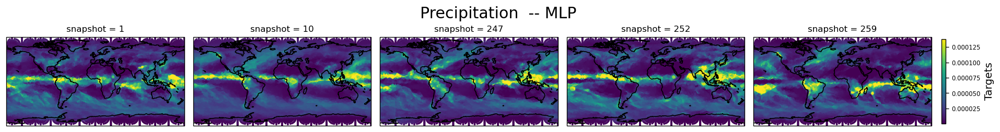

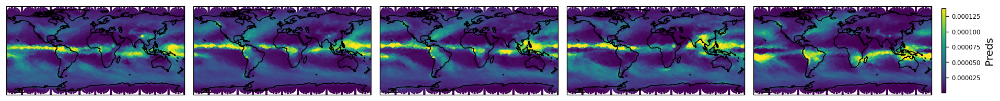

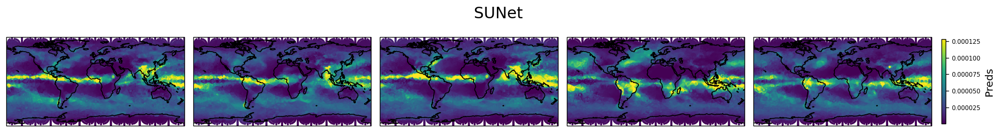

In [23]:
_ = data_snapshots_plotting(ds_mlp, snapshots_to_plot=snapshots, vars_to_plot=['pr'], cmap=None, plot_error=False, title=" -- MLP")
_ = data_snapshots_plotting(ds_sunet, snapshots_to_plot=snapshots, vars_to_plot=['pr'], cmap=None, only_plot_preds=True, title="SUNet")

### Same as above but for normalized/standardized precipitation

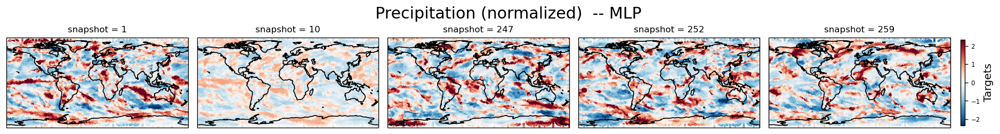

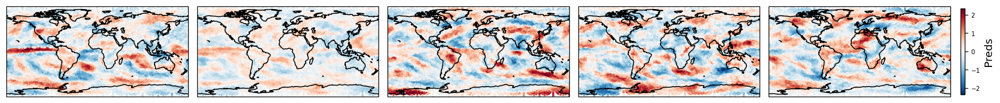

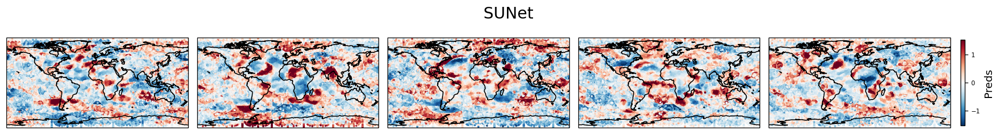

In [22]:
_ = data_snapshots_plotting(ds_mlp, snapshots_to_plot=snapshots, vars_to_plot=['pr_pre'], cmap=None, plot_error=False, title=" -- MLP")
_ = data_snapshots_plotting(ds_sunet, snapshots_to_plot=snapshots, vars_to_plot=['pr_pre'], cmap=None, only_plot_preds=True, title="SUNet")

### Plotting also the errors for the MLP

The first two rows are the same as the ones in the first plot above.
The third one shows prediction - targets, as well as the mean absolute error (MAE) averaged out over latitude and longitude. ***Please note that the errors are scaled by 1e-5 (see top of colorbar in third row)***


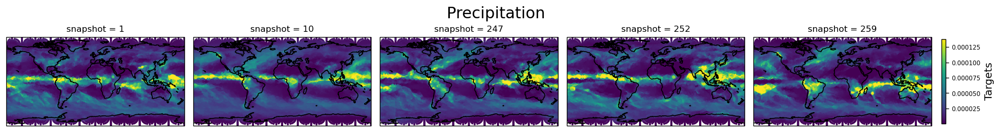

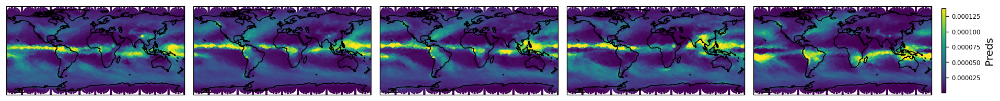

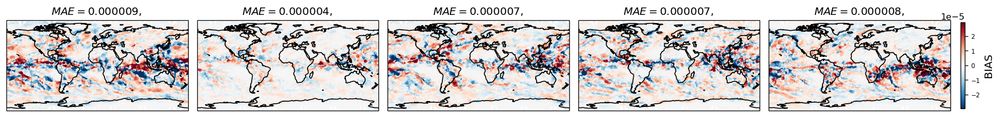

In [24]:
_ = data_snapshots_plotting(ds_mlp, snapshots_to_plot=snapshots, vars_to_plot=['pr'], error_to_plot='bias', cmap=None)

### Comparison between MLP without and with constraints

***Note: the MLP with constraints likely does not have the best coefficients for the physics losses***

In [16]:
rid_all= "2ymsmghz"
ds_all_constraints_mlp = get_predictions_xarray(rid_all, split='val')

INFO:AIBEDO_MLP: Using non-negative precipitation constraint (#4)
INFO:AIBEDO_MLP: Using global moisture constraint (#3)
INFO:AIBEDO_MLP: Using mass conservation constraint (#5)
INFO:aibedo.datamodules.icosahedron_dm: Grid level: 6, # of pixels: 40962


physics_loss_weights: [0.0, 0.0, 100.0, 1.0, 0.0001]


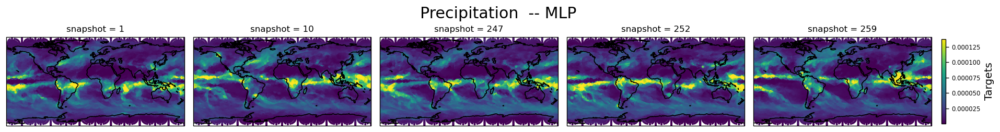

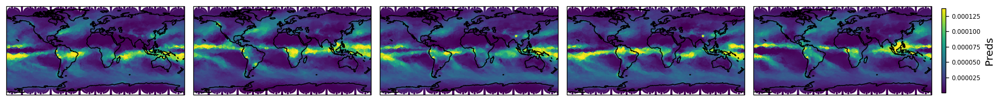

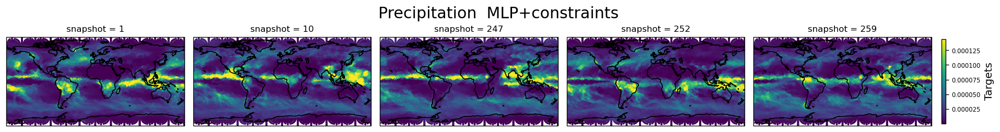

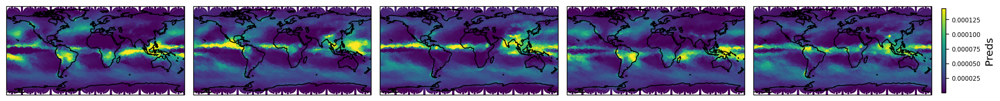

In [23]:
_ = data_snapshots_plotting(ds_mlp, snapshots_to_plot=snapshots, vars_to_plot=['pr'], cmap=None, plot_error=False, title=" -- MLP")
_ = data_snapshots_plotting(ds_all_constraints_mlp, snapshots_to_plot=snapshots, vars_to_plot=['pr'], cmap=None, plot_error=False, title=" MLP+constraints")